# This cat does not exist
__Суммарное количество баллов: 10__

__Решение отправлять на `ml.course.practice@gmail.com`__

__Тема письма: `[ML][MS][HW06] <ФИО>`, где вместо `<ФИО>` указаны фамилия и имя__

Цель этого задания - создать котов, которых не существует. В ходе данного задания вы обучите DCGAN и VAE, которые являются одними из первых генеративных моделей. Для этого задания вам наверняка потребуется GPU с CUDA, поэтому рекомендуется использовать Google Colab.

In [2]:
import torch
from torch import nn
from torch.optim import Adam
from torch.nn import functional as F
from torch.utils.data import Dataset, DataLoader
import os 
import cv2
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import random
import numpy as np

torch.manual_seed(0)
np.random.seed(0)

%matplotlib inline

In [3]:
def random_noise(batch_size, channels, side_size):
    return torch.randn(batch_size, channels, side_size, side_size).cuda()

def imagewide_average(x):
    return x.mean(dim=(-1, -2))

In [4]:
def visualise(imgs, rows=2):
    imgs = (imgs.transpose(1, 3) + 1) / 2
    imgs = torch.cat([imgs[i::rows] for i in range(rows)], dim=1)
    cols = len(imgs)
    imgs = (torch.cat(list(imgs), dim=1)).cpu().numpy()[:, :, ::-1]
    plt.figure(figsize=(cols*1.5, rows*1.5))
    plt.imshow(imgs)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

In [5]:
class CatDataset(Dataset):
    def __init__(self, path_to_dataset="cat_136", size=64):
        self.photo_names = os.listdir(path_to_dataset)
        self.path_base = path_to_dataset
        self.size = size
    
    def __getitem__(self, index):
        path = self.path_base + "/" + self.photo_names[index]
        img = cv2.imread(path) # 136 x 136
        crop_rate = 8
        x_crop = random.randint(0, crop_rate)
        y_crop = random.randint(0, crop_rate)
        img = img[x_crop:136 - crop_rate + x_crop, y_crop:136 - crop_rate + y_crop]
        img = cv2.resize(img, (self.size, self.size), interpolation=cv2.INTER_CUBIC)
        return 2 * torch.tensor(img).float().transpose(0, 2) / 255. - 1
    
    def __len__(self):
        return len(self.photo_names)

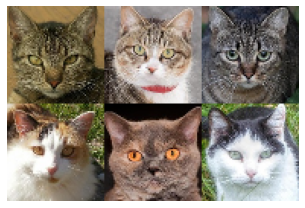

In [6]:
dataset = CatDataset()
visualise(torch.cat([dataset[i].unsqueeze(0) for i in [3, 15, 182, 592, 394, 2941]], dim=0))

### Задание 1 (2 балла)
Для начала реализуем генератор для нашего DCGAN. Предлагается использовать следующую архитектуру:

![](https://drive.google.com/uc?export=view&id=1wt7HV6ZWYdWpi2WEV-gtnJ4PFTWC0HhV)

Для ее реализации вам потребуются модули `nn.BatchNorm2d`, `nn.Conv2d`, `nn.ConvTranspose2D`, `nn.ReLU`, а также функция `F.interpolate`.

#### Методы
* `__init__` - принимает на вход `start_size`, `latent_channels`, `start_channels` и `upsamplings`. Первые два аргумента отвечают за размер случайного шума, из которого в последствии будет сгенерирована картинка. `start_channels` отвечает за то, сколько каналов должно быть в картинке перед тем, как к ней будут применены upsampling блоки. `upsamplings` - это количество upsampling блоков, которые должны быть применены к картинке. В каждом таком локе количество каналов уменьшается в два раза.


* `forward` - принимает на вход `batch_size`, генерирует `batch_size` картинок из случайного шума.

In [7]:
class Generator(nn.Module):
    def __init__(self, start_size=2, latent_channels=32, start_channels=1024, upsamplings=6):
        super().__init__()
        self.__start_size = start_size
        self.__latent_channels = latent_channels
        self.__start_channels = start_channels
        self.__upsamplings = upsamplings

        modules = []

        modules += [
            nn.Conv2d(in_channels=self.__latent_channels, 
                      out_channels=self.__start_channels, 
                      kernel_size=1,
                      stride=1,
                      padding=0,
                      bias=False)
        ]

        c = self.__start_channels
        for _ in range(self.__upsamplings):
            modules += [
                  nn.ConvTranspose2d(in_channels=c, 
                                out_channels=c // 2, 
                                kernel_size=4,
                                stride=2,
                                padding=1,
                                bias=False),
                  nn.BatchNorm2d(c // 2, affine=False),
                  nn.ReLU()      
            ]
            c //= 2

        modules += [
            nn.Conv2d(in_channels=c, 
                      out_channels=3, 
                      kernel_size=1,
                      stride=1,
                      padding=0,
                      bias=False),
            nn.Tanh()
        ]
        
        self.__modules = nn.Sequential(*modules)
    
    def forward(self, batch_size: int):
        input = random_noise(batch_size, self.__latent_channels, self.__start_size)

        return self.__modules(input)

### Задание 2 (2 балла)
Для начала реализуем дискриминатор для нашего DCGAN. Предлагается использовать следующую архитектуру:

![](https://drive.google.com/uc?export=view&id=1zweC-aRSXX2pp8mIK5xr5Zy83OX4vgLY)

Для ее реализации вам потребуются модули `nn.BatchNorm2d`, `nn.Conv2d`, `nn.ReLU` и `nn.Sigmoid`.

#### Методы
* `__init__` - принимает на вход `start_channels` и `downsamplings`. `start_channels` определяет количество каналов, которые должны быть в изображении перед применением downsampling блоков.


* `forward` - принимает на вход `x` - тензор с картинками. Возвращает вектор с размерностью `batch_size`.

In [8]:
class Discriminator(nn.Module):
    def __init__(self, downsamplings=6, start_channels=8):
        super().__init__()
        self.__downsamplings = downsamplings
        self.__start_channels = start_channels

        modules = []

        modules += [
            nn.Conv2d(in_channels=3, 
                      out_channels=self.__start_channels, 
                      kernel_size=1,
                      stride=1,
                      padding=0,
                      bias=False)
        ]

        c = self.__start_channels
        for _ in range(self.__downsamplings):
            modules += [
                nn.Conv2d(in_channels=c, 
                          out_channels=c * 2, 
                          kernel_size=3,
                          stride=2,
                          padding=1,
                          bias=False),
                nn.BatchNorm2d(c * 2, affine=False),
                nn.ReLU()   
            ]
            c *= 2
        
        modules += [
            nn.Flatten(),
            nn.Linear(in_features=c * 4, out_features=1),
            nn.Sigmoid()    
        ]

        self.__modules = nn.Sequential(*modules)
        
    def forward(self, x):
        return self.__modules(x)

In [9]:
def train_gan():
    generator = Generator()
    discriminator = Discriminator()
    epochs = 80
    visualise_every = 10
    batch_size = 8
    generator.cuda()
    discriminator.cuda()

    gen_optim = Adam(generator.parameters(), lr=1e-4, betas=(0.5, 0.999))
    disc_optim = Adam(discriminator.parameters(), lr=1e-4, betas=(0.5, 0.999), weight_decay=1e-5)

    dataset = CatDataset(size=128)

    for ep in range(epochs):
        dataloader = DataLoader(dataset, shuffle=True, batch_size=batch_size)
        total_batches = 0
        gen_loss_avg = 0
        disc_loss_avg = 0

        for i, batch in tqdm(enumerate(dataloader), total=(len(dataset) + batch_size) // batch_size):
            if len(batch) < batch_size:
                continue
            total_batches += 1
            # Positive update
            batch = batch.cuda()
            pred = discriminator(batch)
            loss = F.binary_cross_entropy(pred, torch.ones_like(pred))
            disc_optim.zero_grad()
            loss.backward()
            disc_optim.step()
            disc_loss_avg += loss.item()

            # Negative update
            batch = generator(batch_size).detach()
            pred = discriminator(batch)
            loss = F.binary_cross_entropy(pred, torch.zeros_like(pred))
            disc_optim.zero_grad()
            loss.backward()
            disc_optim.step()
            disc_loss_avg += loss.item()

            # Generator update
            batch = generator(batch_size)
            pred = discriminator(batch)
            loss = F.binary_cross_entropy(pred, torch.ones_like(pred))
            gen_optim.zero_grad()
            loss.backward()
            gen_optim.step()
            gen_loss_avg += loss.item()
        
        if (ep + 1) % visualise_every == 0:
            with torch.no_grad():
                visualise(generator(20), rows=2)

        print(f"Epoch {ep+1} | Discriminator loss: {disc_loss_avg / total_batches} | Generator loss: {gen_loss_avg / total_batches}")


Epoch 1 | Discriminator loss: 0.28585612145150985 | Generator loss: 4.580865315121153



Epoch 2 | Discriminator loss: 0.5078044157181235 | Generator loss: 3.8750505691729717



Epoch 3 | Discriminator loss: 0.7828592431633183 | Generator loss: 2.548471266438502



Epoch 4 | Discriminator loss: 0.8377404175120295 | Generator loss: 2.2853777479866277



Epoch 5 | Discriminator loss: 0.9134750980088453 | Generator loss: 2.062352791428566



Epoch 6 | Discriminator loss: 0.9186075647355791 | Generator loss: 2.1035919384741635



Epoch 7 | Discriminator loss: 0.900052045242028 | Generator loss: 1.9855414948293142



Epoch 8 | Discriminator loss: 0.8854371625611918 | Generator loss: 1.9709613556447236



Epoch 9 | Discriminator loss: 0.8386633117966678 | Generator loss: 2.145971739329166


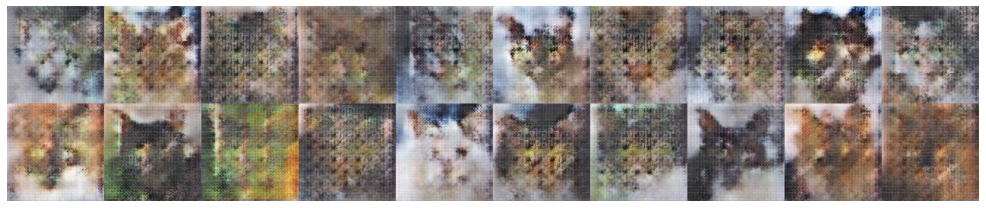

Epoch 10 | Discriminator loss: 0.7846045339080904 | Generator loss: 2.174372093370242



Epoch 11 | Discriminator loss: 0.7073653920651963 | Generator loss: 2.373434602705218



Epoch 12 | Discriminator loss: 0.6939629805491231 | Generator loss: 2.4513523362530685



Epoch 13 | Discriminator loss: 0.6520269823214329 | Generator loss: 2.5175340823968004



Epoch 14 | Discriminator loss: 0.5786012969770551 | Generator loss: 2.708919655554783



Epoch 15 | Discriminator loss: 0.572278337690528 | Generator loss: 2.806771573859342



Epoch 16 | Discriminator loss: 0.5390234920666235 | Generator loss: 2.9427400111041453



Epoch 17 | Discriminator loss: 0.5134878901725705 | Generator loss: 3.0642468010231574



Epoch 18 | Discriminator loss: 0.45611862254365904 | Generator loss: 3.256397289518984



Epoch 19 | Discriminator loss: 0.463849037841739 | Generator loss: 3.1786355465095237


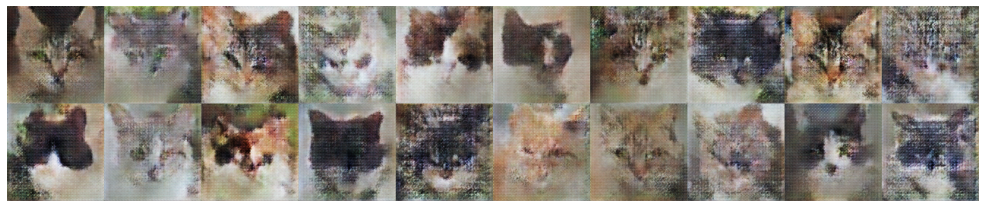

Epoch 20 | Discriminator loss: 0.4460827232858561 | Generator loss: 3.295233955942326



Epoch 21 | Discriminator loss: 0.3866220916231287 | Generator loss: 3.593479086893686



Epoch 22 | Discriminator loss: 0.40285129909550405 | Generator loss: 3.548970795936466



Epoch 23 | Discriminator loss: 0.39125004834385213 | Generator loss: 3.5949825535279625



Epoch 24 | Discriminator loss: 0.3753977507752871 | Generator loss: 3.595445015508196



Epoch 25 | Discriminator loss: 0.35854426908823056 | Generator loss: 3.617848198513807



Epoch 26 | Discriminator loss: 0.36862749164803904 | Generator loss: 3.7479920474268633



Epoch 27 | Discriminator loss: 0.3528429359992639 | Generator loss: 3.7958110931867397



Epoch 28 | Discriminator loss: 0.33611108943911877 | Generator loss: 3.919850142059489



Epoch 29 | Discriminator loss: 0.3679613503869258 | Generator loss: 3.76569169153523


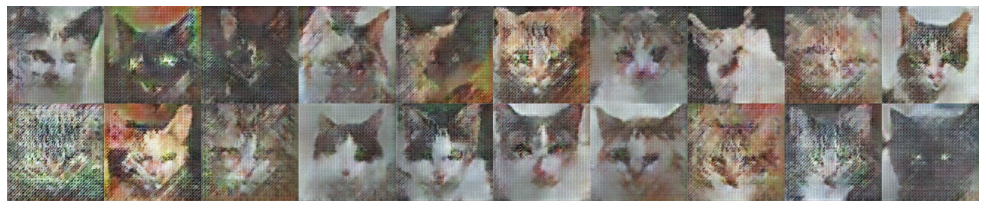

Epoch 30 | Discriminator loss: 0.36013121413771215 | Generator loss: 3.9163217159531873



Epoch 31 | Discriminator loss: 0.36536594362111846 | Generator loss: 3.750794653936943



Epoch 32 | Discriminator loss: 0.31869897199337077 | Generator loss: 3.9758359518665705



Epoch 33 | Discriminator loss: 0.30445617424462534 | Generator loss: 4.0743678675860355



Epoch 34 | Discriminator loss: 0.35106787099106646 | Generator loss: 3.9294983940835326



Epoch 35 | Discriminator loss: 0.3216095985669329 | Generator loss: 3.8885394409761664



Epoch 36 | Discriminator loss: 0.3110568957875652 | Generator loss: 4.085056316084373



Epoch 37 | Discriminator loss: 0.2798706060497668 | Generator loss: 4.303465993693156



Epoch 38 | Discriminator loss: 0.27702079515273575 | Generator loss: 4.36431647226307



Epoch 39 | Discriminator loss: 0.2668940683654441 | Generator loss: 4.3410639169608585


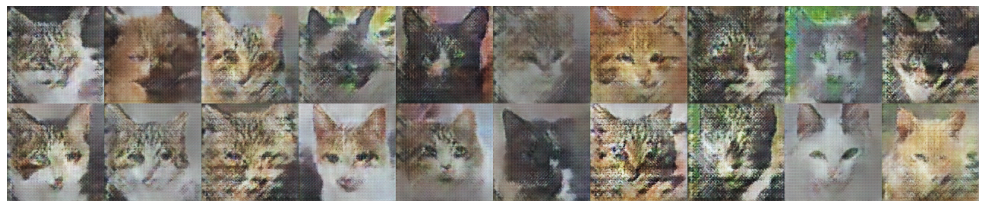

Epoch 40 | Discriminator loss: 0.294589285148764 | Generator loss: 4.408617327024477



Epoch 41 | Discriminator loss: 0.30659434166701677 | Generator loss: 4.298034755894856



Epoch 42 | Discriminator loss: 0.28321760019944064 | Generator loss: 4.1699695059601565



Epoch 43 | Discriminator loss: 0.26366810699397797 | Generator loss: 4.343180306949971



Epoch 44 | Discriminator loss: 0.2826284506992344 | Generator loss: 4.300325692162751



Epoch 45 | Discriminator loss: 0.2713571767495941 | Generator loss: 4.196753116636913



Epoch 46 | Discriminator loss: 0.2656861602532382 | Generator loss: 4.269814099399199



Epoch 47 | Discriminator loss: 0.27036338551335565 | Generator loss: 4.4353288356561835



Epoch 48 | Discriminator loss: 0.2593295665821843 | Generator loss: 4.502711861006777



Epoch 49 | Discriminator loss: 0.24188837963035062 | Generator loss: 4.551778044204534


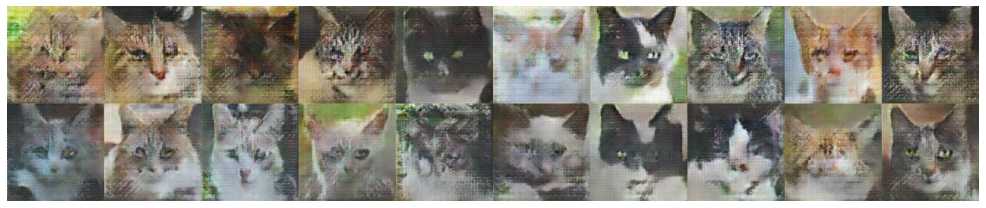

Epoch 50 | Discriminator loss: 0.23958519765896516 | Generator loss: 4.534696619795716



Epoch 51 | Discriminator loss: 0.2637846677673495 | Generator loss: 4.569902295744197



Epoch 52 | Discriminator loss: 0.27624836806328734 | Generator loss: 4.587201742466933



Epoch 53 | Discriminator loss: 0.2515595944959449 | Generator loss: 4.692696549877617



Epoch 54 | Discriminator loss: 0.21062201010204687 | Generator loss: 4.689986678291552



Epoch 55 | Discriminator loss: 0.22487940291880731 | Generator loss: 4.834382367800481



Epoch 56 | Discriminator loss: 0.23398372596237502 | Generator loss: 4.702985287638184



Epoch 57 | Discriminator loss: 0.23044595990682068 | Generator loss: 4.835789670670255



Epoch 58 | Discriminator loss: 0.23471834219512377 | Generator loss: 4.755700353602445



Epoch 59 | Discriminator loss: 0.22133461162149293 | Generator loss: 4.843245608095797


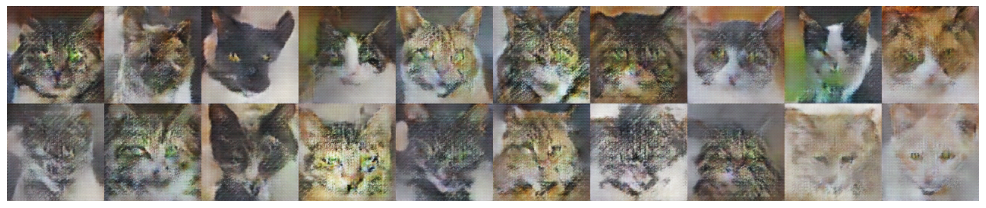

Epoch 60 | Discriminator loss: 0.21909531871457114 | Generator loss: 4.9838260198416915



Epoch 61 | Discriminator loss: 0.22354867059129901 | Generator loss: 4.80312390384837



Epoch 62 | Discriminator loss: 0.22364046008000774 | Generator loss: 4.828173051246945



Epoch 63 | Discriminator loss: 0.2080823953393316 | Generator loss: 5.077464272100363



Epoch 64 | Discriminator loss: 0.20613112610667075 | Generator loss: 4.968798904407839



Epoch 65 | Discriminator loss: 0.22813128036252395 | Generator loss: 4.897527097637609



Epoch 66 | Discriminator loss: 0.2077311388459392 | Generator loss: 4.997120562917697



Epoch 67 | Discriminator loss: 0.21633037366551738 | Generator loss: 5.017023342181437



Epoch 68 | Discriminator loss: 0.19551942543450412 | Generator loss: 5.0596703456726315



Epoch 69 | Discriminator loss: 0.1850462341654897 | Generator loss: 5.04154189458545


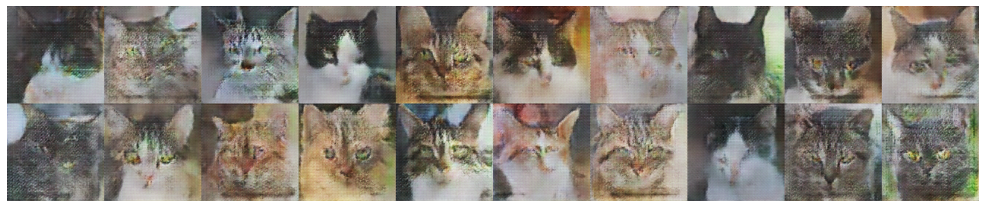

Epoch 70 | Discriminator loss: 0.21398966757763965 | Generator loss: 5.056234558824427



Epoch 71 | Discriminator loss: 0.2002300916966441 | Generator loss: 5.136619215889007



Epoch 72 | Discriminator loss: 0.2115232889458807 | Generator loss: 5.0031649335200745



Epoch 73 | Discriminator loss: 0.19046416490129978 | Generator loss: 4.96645641197329



Epoch 74 | Discriminator loss: 0.19981788658193642 | Generator loss: 5.1706505229939586



Epoch 75 | Discriminator loss: 0.1915662239811275 | Generator loss: 5.268435485984968



Epoch 76 | Discriminator loss: 0.21288673770120978 | Generator loss: 5.153337977872872



Epoch 77 | Discriminator loss: 0.19056313835900646 | Generator loss: 5.196806208872647



Epoch 78 | Discriminator loss: 0.18154815804973692 | Generator loss: 5.173727898170119



Epoch 79 | Discriminator loss: 0.19819318504610117 | Generator loss: 5.206909156641605


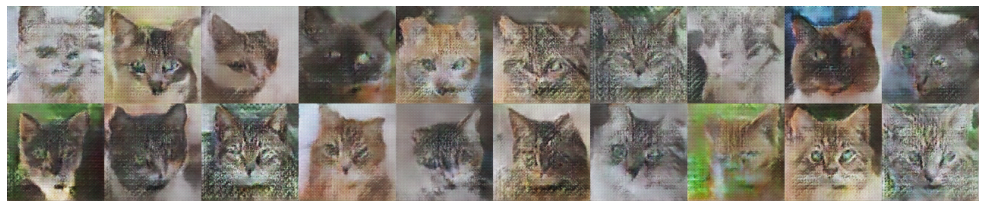

Epoch 80 | Discriminator loss: 0.1734900340036644 | Generator loss: 5.3888494074344635


In [10]:
train_gan()

### Задание 3 (5 баллов)
Теперь посмотрим на другую модель: Variational Autoencoder. В отличии от GAN, в котором генератор пытается себя обмануть дискриминатор, а дискриминатор старается не быть обманутым, VAE решает задачу реконструкции элемента множества X с применением регуляризации в латентном пространстве. 

Полностью архитектура выглядит так:

![](https://drive.google.com/uc?export=view&id=1-JpT_ZJZRHse9VHmW1oHi4oVVVWxsd8r)

Из нее можно выделить две части: Encoder (по изображению возвращает mu и sigma) и Decoder (по случайному шуму восстанавливает изображение). На высоком уровне VAE можно представить так:

![](https://drive.google.com/uc?export=view&id=1rhlUYWR0HjlzPOP_jqn2LoT1YSDlcLI-)

В данном задании вам необходимо реализовать полную архитектуру VAE.

#### Методы
* `__init__` - принимает на вход `img_size`, `downsamplings`, `latent_size`, `linear_hidden_size`, `down_channels` и `up_channels`. `img_size` - размер стороны входного изображения. `downsamplings` - количество downsampling (и upsampling) блоков. `latent_size` - размер латентного пространства, в котором в который будет закодирована картинка. `linear_hidden_size` количество нейронов на скрытом слое полносвязной сети в конце encoder'а. Для полносвязной сети decoder'а это число стоит умножить на 2. `down_channels` - количество каналов, в которое будет преобразовано трехцветное изображение перед применением `downsampling` блоков. `up_channels` - количество каналов, которое должно получиться после применения всех upsampling блоков.

* `forward` - принимает на вход `x`. Считает распределение $N(\mu, \sigma^2)$ и вектор $z \sim N(\mu, \sigma^2)$. Возвращает $x'$ - восстановленную из вектора $z$ картинку и $D_{KL}(N(\mu, \sigma^2), N(0, 1)) = 0.5 \cdot (\sigma^2 + \mu^2 - \log \sigma^2 - 1)$.

* `encode` - принимает на вход `x`. Возвращает вектор из распределения $N(\mu, \sigma^2)$.

* `decode` - принимает на вход `z`. Возвращает восстановленную по вектору картинку.


#### Если хочется улучшить качество
https://arxiv.org/pdf/1906.00446.pdf

In [11]:
class VAE(nn.Module):
    def __init__(self, img_size=128, downsamplings=5, latent_size=512, linear_hidden_size=1024, down_channels=8, up_channels=16):
        super().__init__()
        downsamplings = int(np.log2(img_size))
        
        self.__img_size = img_size
        self.__downsamplings = downsamplings
        self.__latent_size = latent_size
        self.__linear_hidden_size = linear_hidden_size
        self.__down_channels = down_channels
        self.__up_channels = up_channels

        ####################
        # Encoder
        ###################
        encoder_modules = []

        encoder_modules += [nn.Conv2d(in_channels=3, 
                                      out_channels=self.__down_channels, 
                                      kernel_size=1,
                                      stride=1,
                                      padding=0)]
        
        c = self.__down_channels
        for _ in range(self.__downsamplings):
            encoder_modules += [
                nn.Conv2d(in_channels=c, 
                          out_channels=c * 2, 
                          kernel_size=3,
                          stride=2,
                          padding=1),
                nn.BatchNorm2d(c * 2, affine=False),
                nn.ReLU()   
            ]
            c *= 2
        
        encoder_modules += [nn.Conv2d(in_channels=c, 
                                      out_channels=2 * self.__latent_size, 
                                      kernel_size=1,
                                      stride=1,
                                      padding=0)]

        
        self.encoder = nn.Sequential(*encoder_modules)

        ####################
        # Decoder
        ###################

        self.decoder_input = nn.Linear(self.__latent_size, self.__latent_size * 16)
        c = self.__up_channels * 2 ** self.__downsamplings
        decoder_modules = []

        decoder_modules += [
            nn.Conv2d(in_channels=self.__latent_size, 
                      out_channels=c, 
                      kernel_size=1,
                      stride=1,
                      padding=0)
        ]

        for _ in range(self.__downsamplings):
            decoder_modules += [
                  nn.ConvTranspose2d(in_channels=c, 
                                    out_channels=c // 2, 
                                    kernel_size=4,
                                    stride=2,
                                    padding=1),
                  nn.BatchNorm2d(c // 2, affine=False),
                  nn.ReLU(),     
            ]
            c //= 2

        decoder_modules += [
            nn.Conv2d(in_channels=self.__up_channels, 
                      out_channels=3, 
                      kernel_size=1,
                      stride=1,
                      padding=0),
            nn.Tanh()
        ]

        self.decoder = nn.Sequential(*decoder_modules)
        
    def forward(self, x):
        mu, sigma = self.__get_mu_sigma(x)
        eps = torch.randn_like(sigma)
        z = eps * sigma + mu

        x_pred = self.decode(z)
        kld = 0.5 * (sigma ** 2 + mu ** 2 - torch.log(sigma ** 2) - 1)

        return x_pred, kld

    def __get_mu_sigma(self, x):
        input = self.encoder(x)

        mu = input[:, :self.__latent_size]
        sigma = torch.exp(input[:, self.__latent_size:])

        return mu, sigma
    
    def encode(self, x):
        mu, sigma = self.__get_mu_sigma(x)
        eps = torch.randn_like(sigma)
        z = eps * sigma + mu

        return z
    
    def decode(self, z):
        return self.decoder(z)


Epoch 1 | Reconstruction loss: 11685.63881138393 | KLD loss: 275.1106206052792



Epoch 2 | Reconstruction loss: 7328.610886093993 | KLD loss: 407.85078131634253



Epoch 3 | Reconstruction loss: 6686.962026276204 | KLD loss: 495.0468422552073



Epoch 4 | Reconstruction loss: 6439.763380346832 | KLD loss: 522.935760687597



Epoch 5 | Reconstruction loss: 6178.776545364664 | KLD loss: 566.4620199736601



Epoch 6 | Reconstruction loss: 5985.320363299446 | KLD loss: 594.0800788832007



Epoch 7 | Reconstruction loss: 5785.37872162813 | KLD loss: 615.118027302049



Epoch 8 | Reconstruction loss: 5630.8402592439825 | KLD loss: 636.7826094538528



Epoch 9 | Reconstruction loss: 5458.778715335064 | KLD loss: 649.676172955436


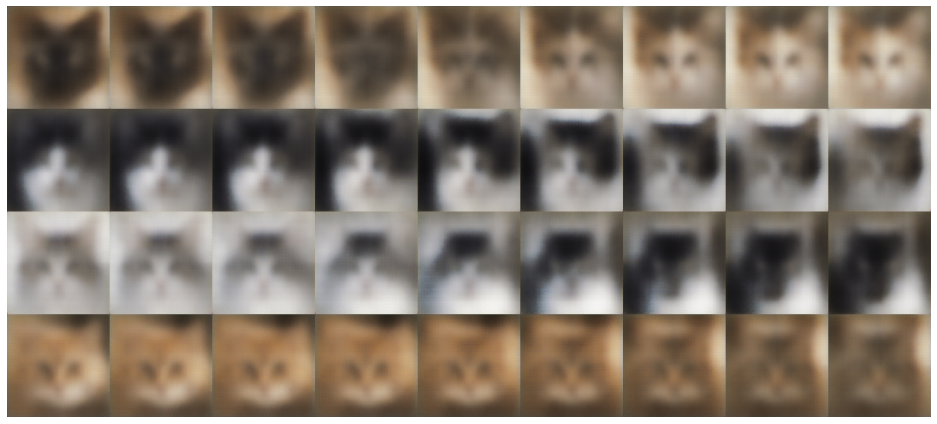

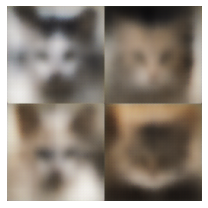


Epoch 10 | Reconstruction loss: 5366.744817698224 | KLD loss: 657.6895057251735



Epoch 11 | Reconstruction loss: 5254.564134680707 | KLD loss: 665.8320111576814



Epoch 12 | Reconstruction loss: 5147.336164202009 | KLD loss: 670.3510451227982



Epoch 13 | Reconstruction loss: 5083.928860682138 | KLD loss: 672.6707254729656



Epoch 14 | Reconstruction loss: 5008.8476899899315 | KLD loss: 680.3569695135081



Epoch 15 | Reconstruction loss: 4953.880716454169 | KLD loss: 682.6437426264982



Epoch 16 | Reconstruction loss: 4907.6086194530035 | KLD loss: 692.6879658195543



Epoch 17 | Reconstruction loss: 4869.223321950213 | KLD loss: 696.4001522656554



Epoch 18 | Reconstruction loss: 4791.040112228868 | KLD loss: 705.621399683982



Epoch 19 | Reconstruction loss: 4761.172765506721 | KLD loss: 715.4222476556434


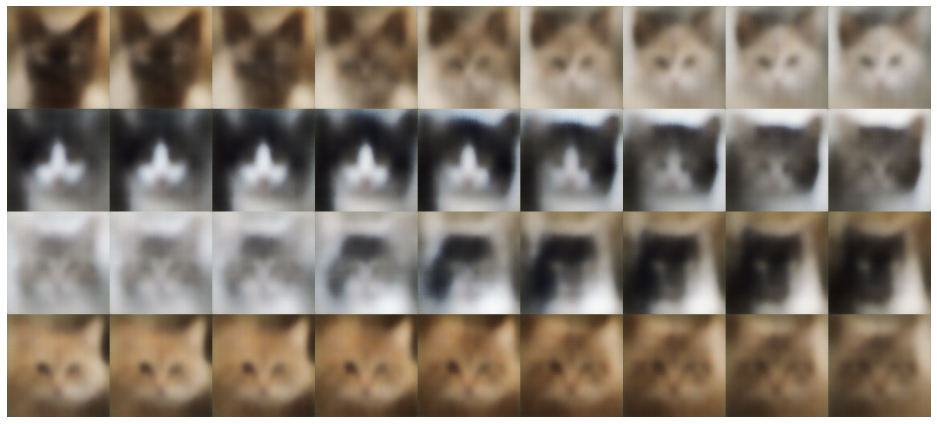

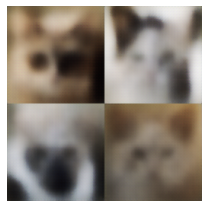


Epoch 20 | Reconstruction loss: 4730.998958990441 | KLD loss: 717.4584513599087



Epoch 21 | Reconstruction loss: 4653.44170953028 | KLD loss: 719.5246872990768



Epoch 22 | Reconstruction loss: 4651.819728685462 | KLD loss: 723.7601596998131



Epoch 23 | Reconstruction loss: 4586.923774671851 | KLD loss: 731.3309238978794



Epoch 24 | Reconstruction loss: 4519.414288822909 | KLD loss: 733.388693578495



Epoch 25 | Reconstruction loss: 4500.927819672579 | KLD loss: 734.5706199503834



Epoch 26 | Reconstruction loss: 4449.200029266547 | KLD loss: 738.7352156550247



Epoch 27 | Reconstruction loss: 4439.508130565193 | KLD loss: 739.8866679505531



Epoch 28 | Reconstruction loss: 4385.576605186699 | KLD loss: 742.8066373078719



Epoch 29 | Reconstruction loss: 4357.096347974694 | KLD loss: 743.9051499455612


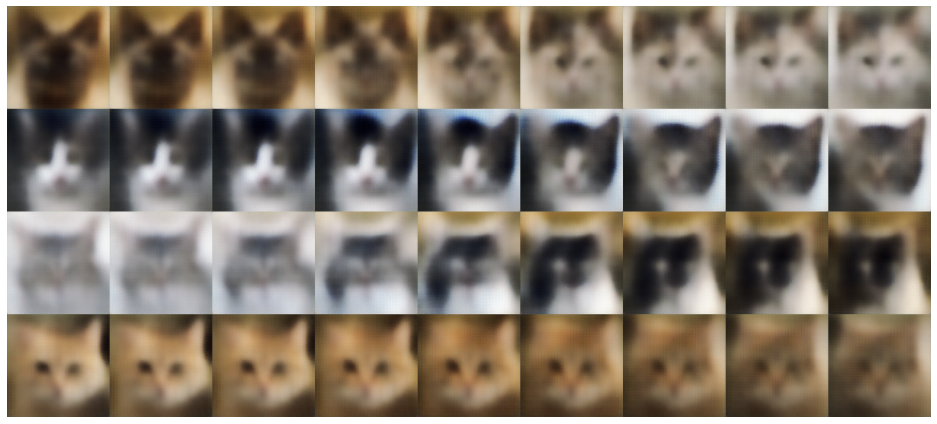

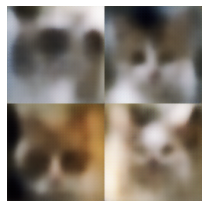


Epoch 30 | Reconstruction loss: 4341.776965407851 | KLD loss: 748.0897698254319



Epoch 31 | Reconstruction loss: 4313.0107755483305 | KLD loss: 752.0553068551958



Epoch 32 | Reconstruction loss: 4265.356493837345 | KLD loss: 753.70058597541



Epoch 33 | Reconstruction loss: 4247.480717060729 | KLD loss: 752.4561835816188



Epoch 34 | Reconstruction loss: 4214.702049113209 | KLD loss: 758.7846130939744



Epoch 35 | Reconstruction loss: 4172.596954535254 | KLD loss: 759.746725236407



Epoch 36 | Reconstruction loss: 4134.3737493479475 | KLD loss: 757.125555666337



Epoch 37 | Reconstruction loss: 4128.933395859618 | KLD loss: 751.5049552206667



Epoch 38 | Reconstruction loss: 4086.8356664432504 | KLD loss: 766.9225052543309



Epoch 39 | Reconstruction loss: 4063.5143224111994 | KLD loss: 766.0137402078379


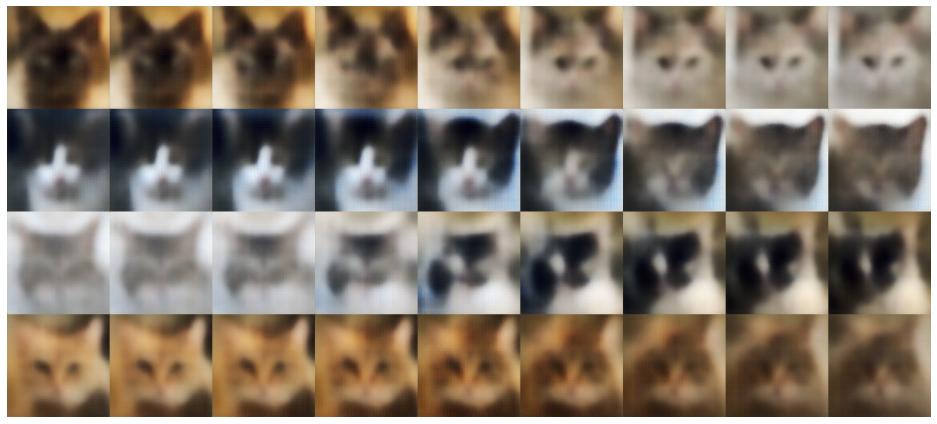

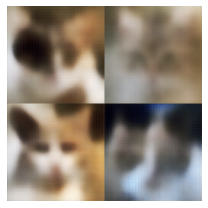


Epoch 40 | Reconstruction loss: 4018.0012764308763 | KLD loss: 763.8245201347778



Epoch 41 | Reconstruction loss: 4013.1956559649166 | KLD loss: 772.1837388506588



Epoch 42 | Reconstruction loss: 3998.8162928989955 | KLD loss: 765.5136448641001



Epoch 43 | Reconstruction loss: 3976.0347130816917 | KLD loss: 769.9602541716202



Epoch 44 | Reconstruction loss: 3964.9611789869227 | KLD loss: 771.8330614551994



Epoch 45 | Reconstruction loss: 3918.9654904951963 | KLD loss: 766.9055284772601



Epoch 46 | Reconstruction loss: 3904.998364561093 | KLD loss: 774.9096496771581



Epoch 47 | Reconstruction loss: 3874.343205232798 | KLD loss: 769.9319882600204



Epoch 48 | Reconstruction loss: 3884.9465881726755 | KLD loss: 772.3398903793429



Epoch 49 | Reconstruction loss: 3857.4961794266787 | KLD loss: 773.1824018585015


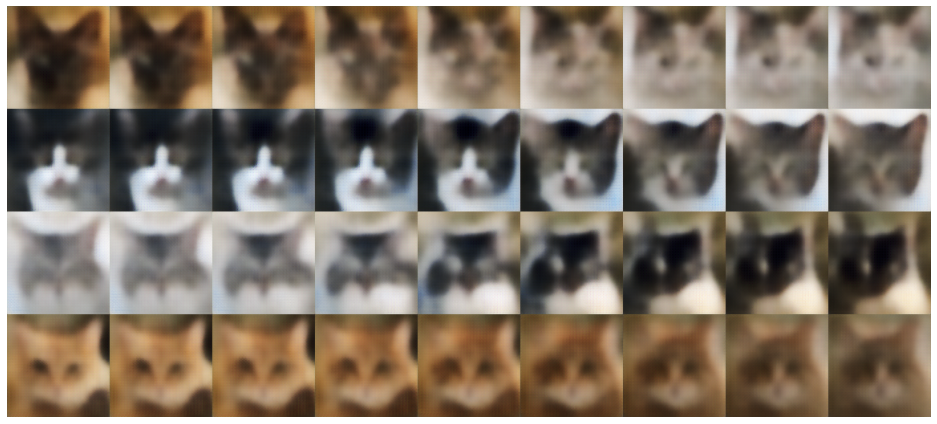

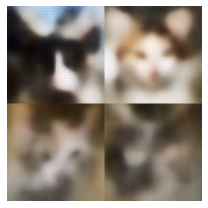


Epoch 50 | Reconstruction loss: 3852.560936211059 | KLD loss: 774.3283497117321



Epoch 51 | Reconstruction loss: 3803.9325307526206 | KLD loss: 775.9279314124066



Epoch 52 | Reconstruction loss: 3800.7167536575603 | KLD loss: 777.5139089074935



Epoch 53 | Reconstruction loss: 3800.757849272734 | KLD loss: 774.0295340970437



Epoch 54 | Reconstruction loss: 3783.1138658227387 | KLD loss: 775.4366152745596



Epoch 55 | Reconstruction loss: 3757.829309688592 | KLD loss: 778.435926638775



Epoch 56 | Reconstruction loss: 3747.0082568056096 | KLD loss: 778.5534560872901



Epoch 57 | Reconstruction loss: 3732.4536496748838 | KLD loss: 783.2018476213727



Epoch 58 | Reconstruction loss: 3722.509388041052 | KLD loss: 777.6278343437622



Epoch 59 | Reconstruction loss: 3701.4530791288576 | KLD loss: 774.5225686019992


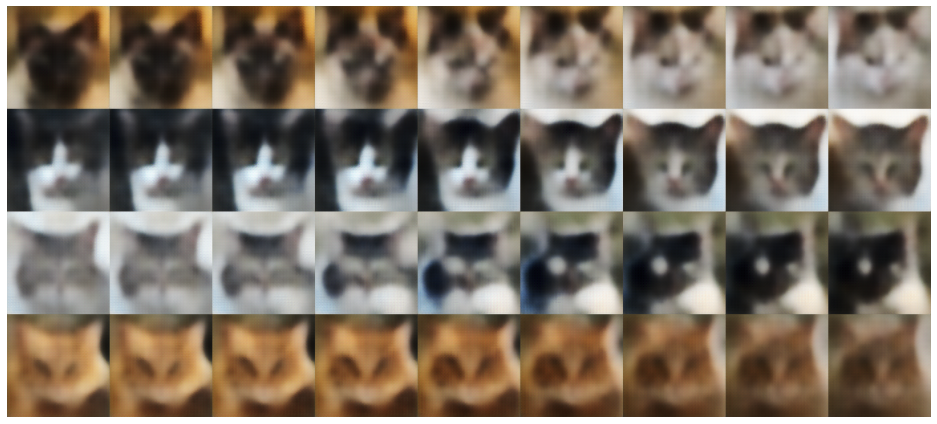

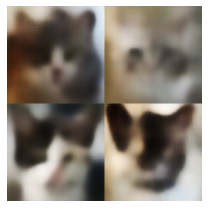


Epoch 60 | Reconstruction loss: 3699.9733977702836 | KLD loss: 779.4619644828465


In [12]:
def train_vae():
    vae = VAE()
    vae.cuda()

    epochs = 60
    batch_size = 8
    vae_optim = Adam(vae.parameters(), lr=1e-4)

    dataset = CatDataset(size=128)

    test_imgs_1 = torch.cat([dataset[i].unsqueeze(0) for i in (0, 34, 76, 1509)])
    test_imgs_2 = torch.cat([dataset[i].unsqueeze(0) for i in (734, 123, 512, 3634)])

    for ep in range(epochs):
        dataloader = DataLoader(dataset, shuffle=True, batch_size=batch_size)
        total_batches = 0
        rec_loss_avg = 0
        kld_loss_avg = 0

        if (ep + 1) % 10 == 0:
            with torch.no_grad():
                z_1 = vae.encode(test_imgs_1.cuda())
                z_2 = vae.encode(test_imgs_2.cuda())
                x_int = []
                for i in range(9):
                    z = (i * z_1 + (8 - i) * z_2) / 8
                    x_int.append(vae.decode(z))
                x_int = torch.cat(x_int)
                visualise(x_int, rows=len(test_imgs_1))
                z_rand = torch.randn_like(z_1)
                x_int = vae.decode(z_rand)
                visualise(x_int, rows=len(test_imgs_1)//2)

        for i, batch in tqdm(enumerate(dataloader), total=(len(dataset) + batch_size) // batch_size):
            if len(batch) < batch_size:
                continue
            total_batches += 1
            x = batch.cuda()
            x_rec, kld = vae(x)
            img_elems = float(np.prod(list(batch.size())))
            kld_loss = kld.sum() / batch_size
            rec_loss = ((x_rec - x)**2).sum() / batch_size
            loss = rec_loss + 0.1 * kld_loss # https://openreview.net/forum?id=Sy2fzU9gl
            vae_optim.zero_grad()
            loss.backward()
            vae_optim.step()
            kld_loss_avg += kld_loss.item()
            rec_loss_avg += rec_loss.item()

        print(f"Epoch {ep+1} | Reconstruction loss: {rec_loss_avg / total_batches} | KLD loss: {kld_loss_avg / total_batches}")

train_vae()